In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
from lightgbm import LGBMClassifier
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder, StandardScaler
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, roc_auc_score
plt.rcParams['figure.figsize'] = (8,4)
plt.rcParams['figure.dpi'] = 250
plt.show()

In [2]:
train = pd.read_csv('Titanic_train.csv')
test = pd.read_csv('Titanic_test.csv')

In [3]:
train

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C


###  Exploratory Data ANalysis

In [4]:

train.describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,891.000000,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000
mean,446.000000,0.383838,2.308642,29.699118,0.523008,0.381594,32.204208
std,257.353842,0.486592,0.836071,14.526497,1.102743,0.806057,49.693429
min,1.000000,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,223.500000,0.000000,2.000000,20.125000,0.000000,0.000000,7.910400
50%,446.000000,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,668.500000,1.000000,3.000000,38.000000,1.000000,0.000000,31.000000
max,891.000000,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


In [6]:
# Checking missing values
# Checking for missing values in Testing Dataset.

train.isna().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [7]:
# Checking for missing values in Testing Dataset.

test.isna().sum()

PassengerId      0
Pclass           0
Name             0
Sex              0
Age             86
SibSp            0
Parch            0
Ticket           0
Fare             1
Cabin          327
Embarked         0
dtype: int64

In [8]:
# Imputing missing values in Training Data
# As the training data is too small so we can't delete records with missing values. So we need to replace it.
# Replacing NaN (Missing) values in 'Age' column with its median value. 
# As the 'Cabin' and 'Embarked' columns are categorical, replacing missing values with mode value.

train['Age'].fillna(train['Age'].median(), inplace=True)

In [9]:
train['Cabin'].mode()

0        B96 B98
1    C23 C25 C27
2             G6
Name: Cabin, dtype: object

In [10]:
train['Embarked'].mode()

0    S
Name: Embarked, dtype: object

In [11]:
train['Cabin'].fillna('B96 B98', inplace=True)
train['Embarked'].fillna('S', inplace=True)

In [12]:
train.isna().sum()

PassengerId    0
Survived       0
Pclass         0
Name           0
Sex            0
Age            0
SibSp          0
Parch          0
Ticket         0
Fare           0
Cabin          0
Embarked       0
dtype: int64

In [13]:
# Missing values in Training Dataset is replaced.

In [15]:
# Imputing missing values in Testing Data

test['Age'].fillna(test['Age'].median(), inplace=True)
test['Fare'].fillna(test['Fare'].median(), inplace=True)

In [16]:
test['Cabin'].mode()

0    B57 B59 B63 B66
Name: Cabin, dtype: object

In [17]:
test['Cabin'].fillna('B57 B59 B63 B66', inplace=True)

In [18]:
test.isna().sum()

PassengerId    0
Pclass         0
Name           0
Sex            0
Age            0
SibSp          0
Parch          0
Ticket         0
Fare           0
Cabin          0
Embarked       0
dtype: int64

### Visualization

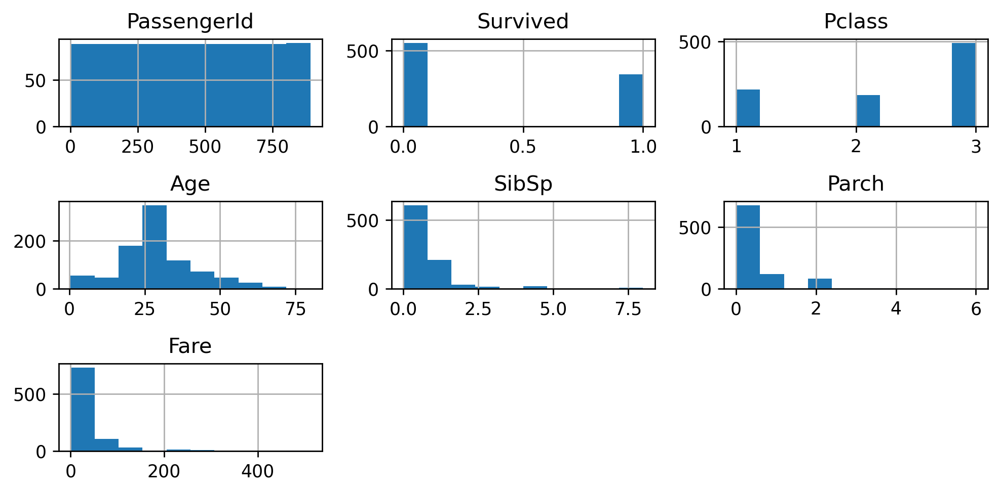

In [20]:
# Histogram for visualizing data distributions of numerical columns
train.hist()
plt.tight_layout()

Text(0.5, 1.0, 'Survival rate of Males and Females')

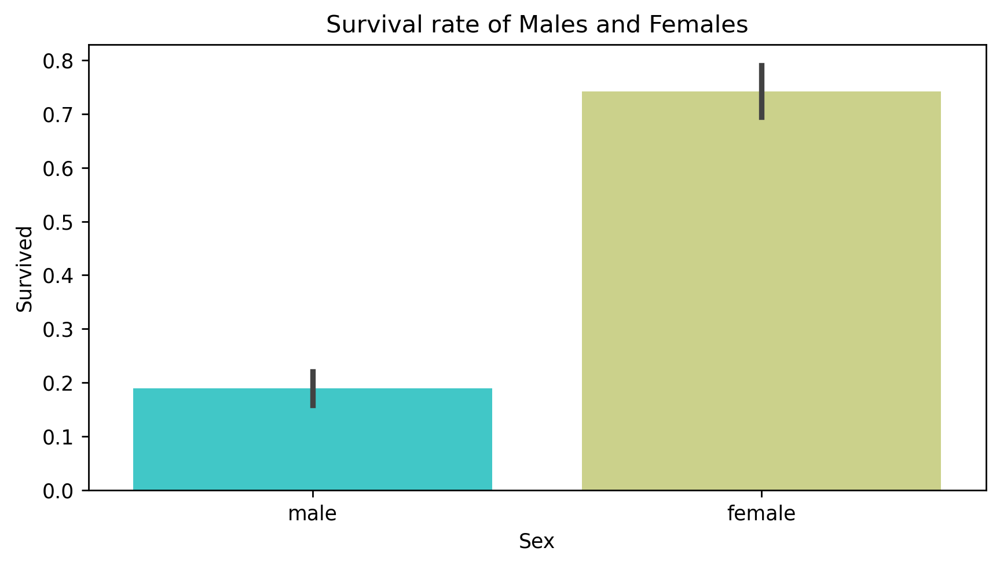

In [21]:
sns.barplot(x = train['Sex'], y = train['Survived'], data=train, palette='rainbow')
plt.title('Survival rate of Males and Females')

Text(0.5, 1.0, 'Barplot between Age, Sex and Pclass')

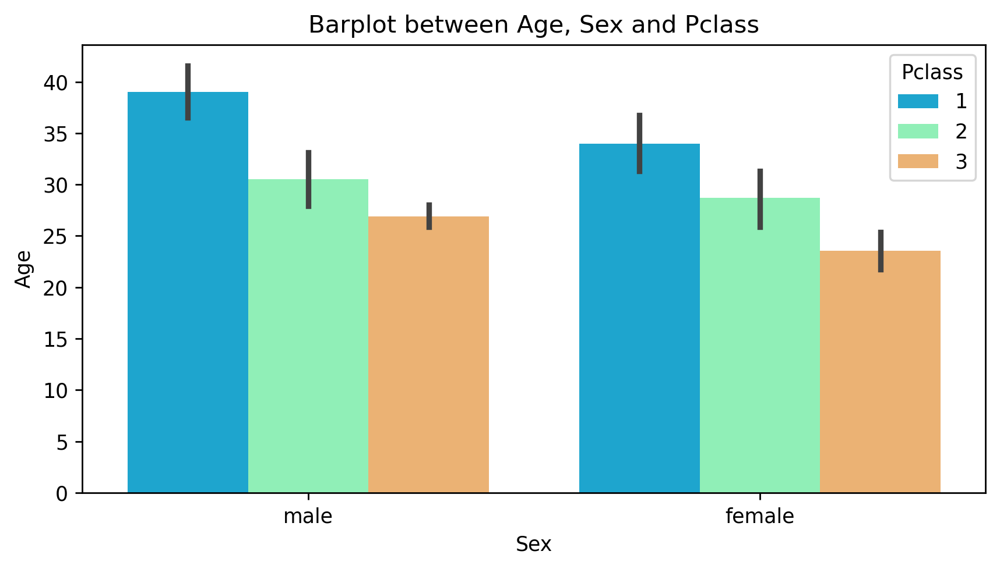

In [22]:
sns.barplot(x = train['Sex'], y = train['Age'], data=train, hue = train['Pclass'], palette='rainbow')
plt.title('Barplot between Age, Sex and Pclass')

C:\Users\Administrator\AppData\Local\Temp\ipykernel_19284\340891418.py:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(train['Fare'], color='skyblue', shade=True)
c:\Users\Administrator\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0, 0.5, 'Density')

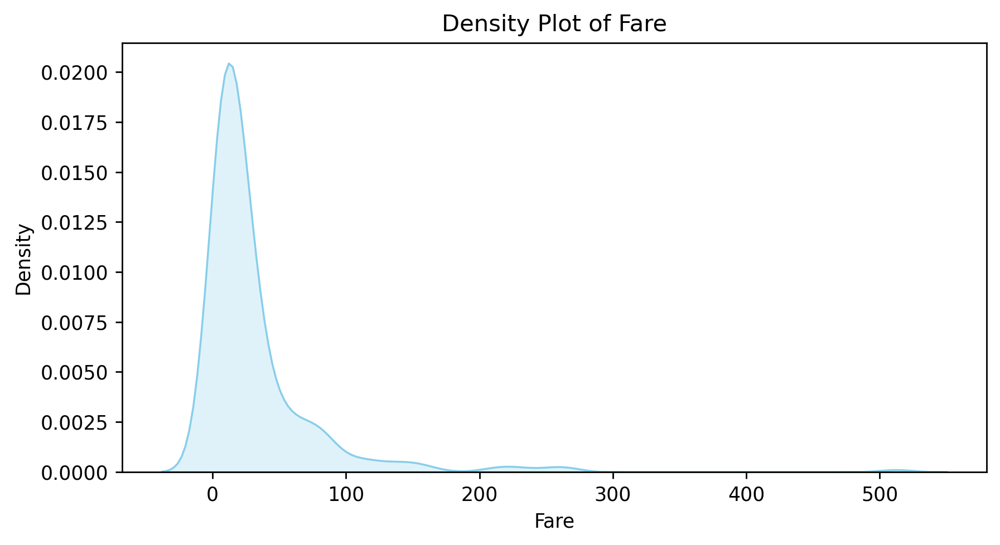

In [23]:
sns.kdeplot(train['Fare'], color='skyblue', shade=True)
plt.title('Density Plot of Fare')
plt.xlabel('Fare')
plt.ylabel('Density')

##### Column 'Fare' is not normally distributed, there is positive skewness present. 

C:\Users\Administrator\AppData\Local\Temp\ipykernel_19284\3988718052.py:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(train['Age'], color='skyblue', shade=True)
c:\Users\Administrator\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0, 0.5, 'Density')

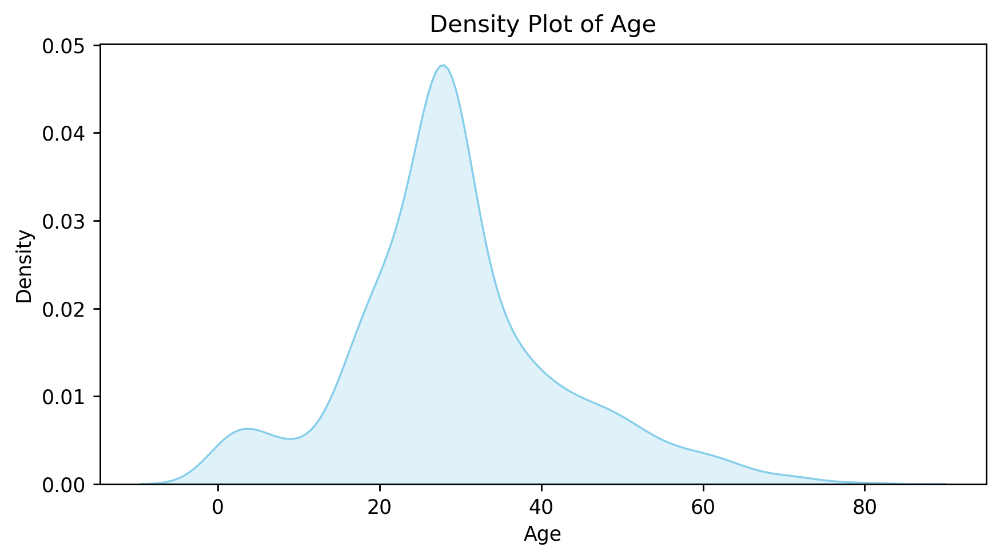

In [24]:
sns.kdeplot(train['Age'], color='skyblue', shade=True)
plt.title('Density Plot of Age')
plt.xlabel('Age')
plt.ylabel('Density')

##### Age column is nearly normaly distributed

In [29]:
# Visualizing correlations between features with target (Survival)

c:\Users\Administrator\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Administrator\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Administrator\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Administrator\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert in

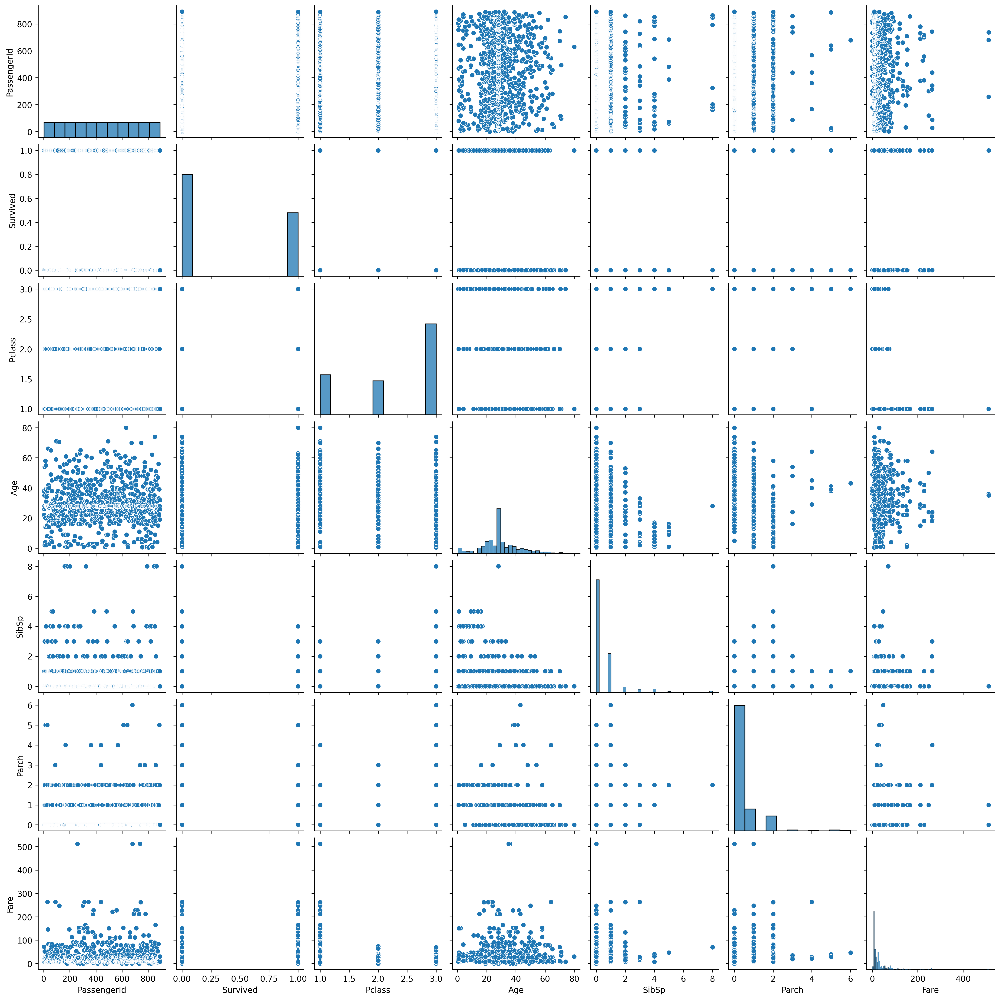

In [28]:
sns.pairplot(train)

C:\Users\Administrator\AppData\Local\Temp\ipykernel_19284\1389193658.py:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = train['Pclass'], y = train['Survived'], data = train, palette = 'viridis')


<Axes: xlabel='Pclass', ylabel='Survived'>

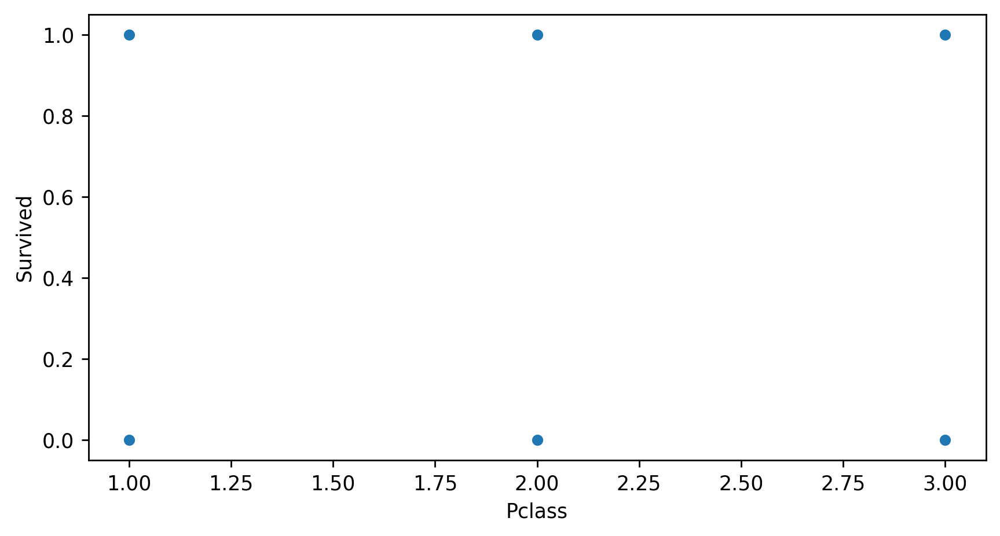

In [29]:
sns.scatterplot(x = train['Pclass'], y = train['Survived'], data = train, palette = 'viridis')

C:\Users\Administrator\AppData\Local\Temp\ipykernel_19284\4074599879.py:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = train['Age'], y = train['Survived'], data = train, palette = 'rainbow')


<Axes: xlabel='Age', ylabel='Survived'>

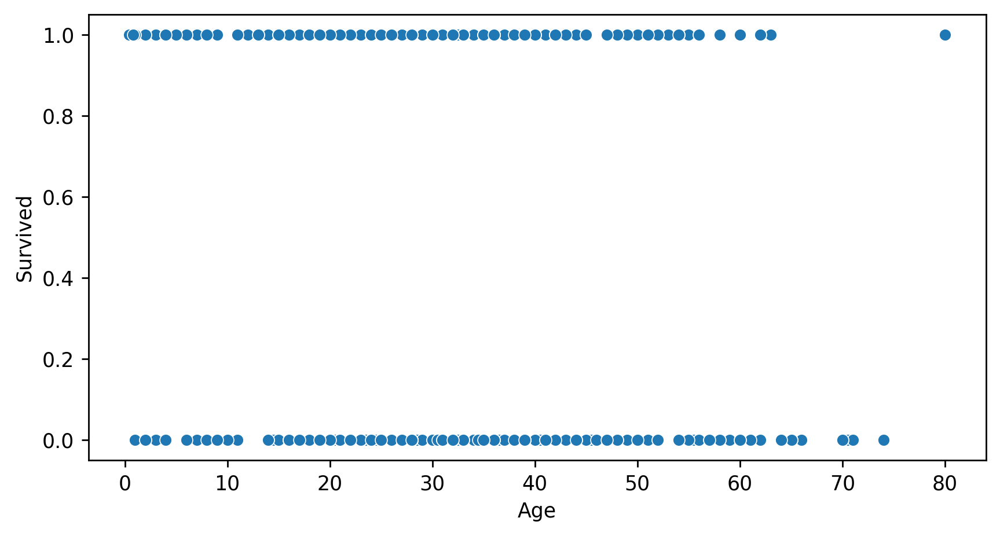

In [30]:
sns.scatterplot(x = train['Age'], y = train['Survived'], data = train, palette = 'rainbow')

C:\Users\Administrator\AppData\Local\Temp\ipykernel_19284\718174472.py:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = train['Fare'], y = train['Survived'], data = train, palette = 'rainbow')


<Axes: xlabel='Fare', ylabel='Survived'>

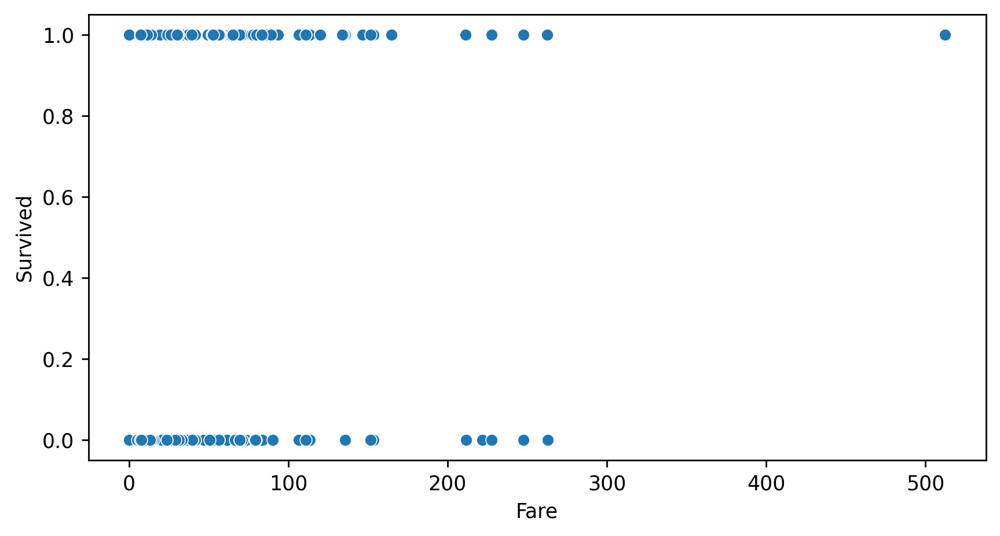

In [31]:
sns.scatterplot(x = train['Fare'], y = train['Survived'], data = train, palette = 'rainbow')

C:\Users\Administrator\AppData\Local\Temp\ipykernel_19284\4095747617.py:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = train['Parch'], y = train['Survived'], data = train, palette = 'rainbow')


<Axes: xlabel='Parch', ylabel='Survived'>

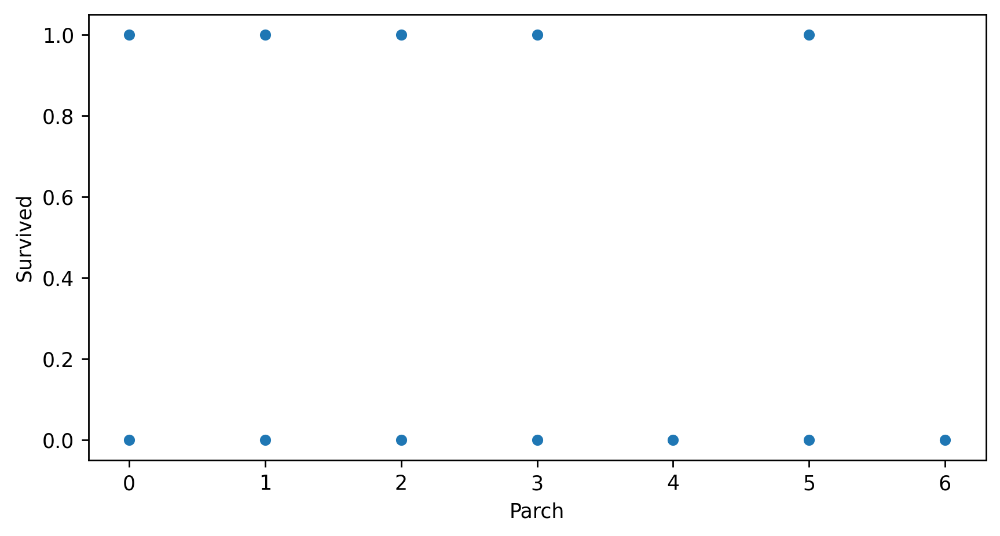

In [32]:
sns.scatterplot(x = train['Parch'], y = train['Survived'], data = train, palette = 'rainbow')

C:\Users\Administrator\AppData\Local\Temp\ipykernel_19284\4027809755.py:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = train['SibSp'], y = train['Survived'], data = train, palette = 'rainbow')


<Axes: xlabel='SibSp', ylabel='Survived'>

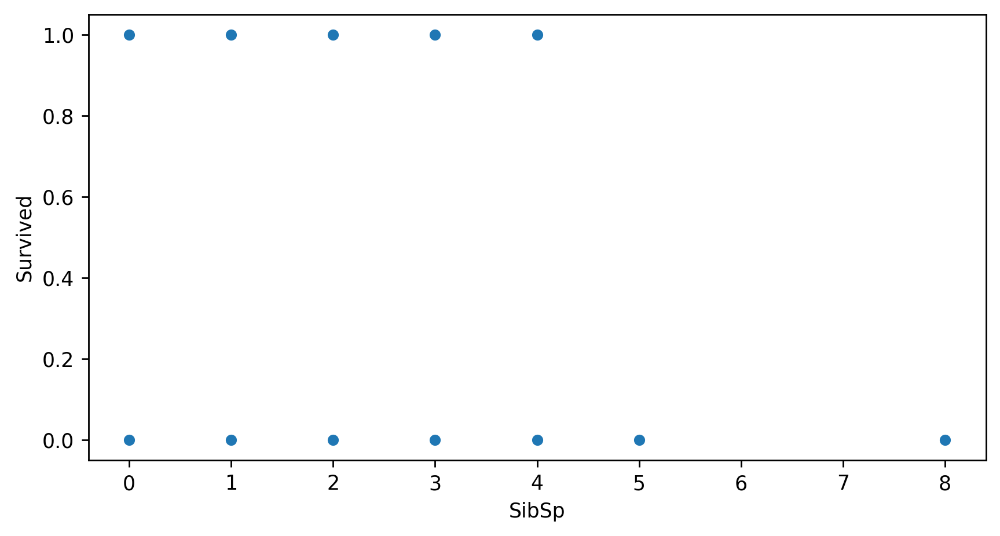

In [33]:
sns.scatterplot(x = train['SibSp'], y = train['Survived'], data = train, palette = 'rainbow')

In [34]:
train

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,B96 B98,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,B96 B98,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,B96 B98,S
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,B96 B98,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,28.0,1,2,W./C. 6607,23.4500,B96 B98,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C


###  Data Preprocessing

In [36]:

# Encoding 'Sex' column into numerical.
le = LabelEncoder()
train['Sex'] = le.fit_transform(train['Sex'])
test['Sex'] = le.fit_transform(test['Sex'])

# Checking the mapping of labels to categories
print("Mapping of labels to categories:")
print(le.classes_)

# Here using LabelEncoding "female" is converted with 0 value and "male" is converted to 1 values.

Mapping of labels to categories:
[0 1]


In [37]:
# Ordinal Encoding for categorical columns with multiple unique values in 'train' dataset.
oe = OrdinalEncoder()
train['Embarked'] = oe.fit_transform(train['Embarked'].values.reshape(-1, 1)) # Embarked column
train['Cabin'] = oe.fit_transform(train['Cabin'].values.reshape(-1, 1))       # Cabin column
train['Ticket'] = oe.fit_transform(train['Ticket'].values.reshape(-1, 1))     # Ticket column

test['Embarked'] = oe.fit_transform(test['Embarked'].values.reshape(-1, 1)) # Embarked column
test['Cabin'] = oe.fit_transform(test['Cabin'].values.reshape(-1, 1))       # Cabin column
test['Ticket'] = oe.fit_transform(test['Ticket'].values.reshape(-1, 1))     # Ticket column

In [38]:
train

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",1,22.0,1,0,523.0,7.2500,47.0,2.0
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",0,38.0,1,0,596.0,71.2833,81.0,0.0
2,3,1,3,"Heikkinen, Miss. Laina",0,26.0,0,0,669.0,7.9250,47.0,2.0
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",0,35.0,1,0,49.0,53.1000,55.0,2.0
4,5,0,3,"Allen, Mr. William Henry",1,35.0,0,0,472.0,8.0500,47.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",1,27.0,0,0,101.0,13.0000,47.0,2.0
887,888,1,1,"Graham, Miss. Margaret Edith",0,19.0,0,0,14.0,30.0000,30.0,2.0
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",0,28.0,1,2,675.0,23.4500,47.0,2.0
889,890,1,1,"Behr, Mr. Karl Howell",1,26.0,0,0,8.0,30.0000,60.0,0.0


In [39]:
test

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",1,34.5,0,0,152.0,7.8292,15.0,1.0
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",0,47.0,1,0,221.0,7.0000,15.0,2.0
2,894,2,"Myles, Mr. Thomas Francis",1,62.0,0,0,73.0,9.6875,15.0,1.0
3,895,3,"Wirz, Mr. Albert",1,27.0,0,0,147.0,8.6625,15.0,2.0
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",0,22.0,1,1,138.0,12.2875,15.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...
413,1305,3,"Spector, Mr. Woolf",1,27.0,0,0,267.0,8.0500,15.0,2.0
414,1306,1,"Oliva y Ocana, Dona. Fermina",0,39.0,0,0,324.0,108.9000,22.0,0.0
415,1307,3,"Saether, Mr. Simon Sivertsen",1,38.5,0,0,346.0,7.2500,15.0,2.0
416,1308,3,"Ware, Mr. Frederick",1,27.0,0,0,220.0,8.0500,15.0,2.0


In [40]:
# removing unnecessary columns.

train = train.drop(columns = ['PassengerId', 'Name'])
test = test.drop(columns = ['PassengerId', 'Name'])

In [41]:
test

,Pclass,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,3,1,34.5,0,0,152.0,7.8292,15.0,1.0
1,3,0,47.0,1,0,221.0,7.0000,15.0,2.0
2,2,1,62.0,0,0,73.0,9.6875,15.0,1.0
3,3,1,27.0,0,0,147.0,8.6625,15.0,2.0
4,3,0,22.0,1,1,138.0,12.2875,15.0,2.0
...,...,...,...,...,...,...,...,...,...
413,3,1,27.0,0,0,267.0,8.0500,15.0,2.0
414,1,0,39.0,0,0,324.0,108.9000,22.0,0.0
415,3,1,38.5,0,0,346.0,7.2500,15.0,2.0
416,3,1,27.0,0,0,220.0,8.0500,15.0,2.0


In [42]:
train

,Survived,Pclass,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,0,3,1,22.0,1,0,523.0,7.2500,47.0,2.0
1,1,1,0,38.0,1,0,596.0,71.2833,81.0,0.0
2,1,3,0,26.0,0,0,669.0,7.9250,47.0,2.0
3,1,1,0,35.0,1,0,49.0,53.1000,55.0,2.0
4,0,3,1,35.0,0,0,472.0,8.0500,47.0,2.0
...,...,...,...,...,...,...,...,...,...,...
886,0,2,1,27.0,0,0,101.0,13.0000,47.0,2.0
887,1,1,0,19.0,0,0,14.0,30.0000,30.0,2.0
888,0,3,0,28.0,1,2,675.0,23.4500,47.0,2.0
889,1,1,1,26.0,0,0,8.0,30.0000,60.0,0.0


In [43]:
target_col = train['Survived']
target_col

0      0
1      1
2      1
3      1
4      0
      ..
886    0
887    1
888    0
889    1
890    0
Name: Survived, Length: 891, dtype: int64

In [44]:
# Normalizing(Standardizing) the data so that all columns will get equal importance while training the model.
sc = StandardScaler()
x = sc.fit_transform(train.drop(columns=['Survived'])) # removing target column because it's values are already in range of 0 to 1
train = pd.DataFrame(x, columns=train.drop(columns=['Survived']).columns)
y = sc.fit_transform(test)
test = pd.DataFrame(y, columns = test.columns)

In [45]:
test

,Pclass,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,0.873482,0.755929,0.386231,-0.499470,-0.400248,-0.269494,-0.497413,-0.351490,-0.470915
1,0.873482,-1.322876,1.371370,0.616992,-0.400248,0.372934,-0.512278,-0.351490,0.700767
2,-0.315819,0.755929,2.553537,-0.499470,-0.400248,-1.005027,-0.464100,-0.351490,-0.470915
3,0.873482,0.755929,-0.204852,-0.499470,-0.400248,-0.316046,-0.482475,-0.351490,0.700767
4,0.873482,-1.322876,-0.598908,0.616992,0.619896,-0.399841,-0.417492,-0.351490,0.700767
...,...,...,...,...,...,...,...,...,...
413,0.873482,0.755929,-0.204852,-0.499470,-0.400248,0.801219,-0.493455,-0.351490,0.700767
414,-1.505120,-1.322876,0.740881,-0.499470,-0.400248,1.331921,1.314435,0.170042,-1.642598
415,0.873482,0.755929,0.701476,-0.499470,-0.400248,1.536753,-0.507796,-0.351490,0.700767
416,0.873482,0.755929,-0.204852,-0.499470,-0.400248,0.363624,-0.493455,-0.351490,0.700767


In [46]:
train

,Pclass,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,0.827377,0.737695,-0.565736,0.432793,-0.473674,0.918966,-0.502445,-0.281881,0.585954
1,-1.566107,-1.355574,0.663861,0.432793,-0.473674,1.282625,0.786845,1.161545,-1.942303
2,0.827377,-1.355574,-0.258337,-0.474545,-0.473674,1.646283,-0.488854,-0.281881,0.585954
3,-1.566107,-1.355574,0.433312,0.432793,-0.473674,-1.442322,0.420730,0.057748,0.585954
4,0.827377,0.737695,0.433312,-0.474545,-0.473674,0.664904,-0.486337,-0.281881,0.585954
...,...,...,...,...,...,...,...,...,...
886,-0.369365,0.737695,-0.181487,-0.474545,-0.473674,-1.183277,-0.386671,-0.281881,0.585954
887,-1.566107,-1.355574,-0.796286,-0.474545,-0.473674,-1.616678,-0.044381,-1.003594,0.585954
888,0.827377,-1.355574,-0.104637,0.432793,2.008933,1.676173,-0.176263,-0.281881,0.585954
889,-1.566107,0.737695,-0.258337,-0.474545,-0.473674,-1.646568,-0.044381,0.270017,-1.942303


In [47]:
# Now our data has been normalized and ready for machine learning
# But the target column is not present in training data
# Adding target column into 'train' dataset.

train['Survived'] = target_col
train

,Pclass,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived
0,0.827377,0.737695,-0.565736,0.432793,-0.473674,0.918966,-0.502445,-0.281881,0.585954,0
1,-1.566107,-1.355574,0.663861,0.432793,-0.473674,1.282625,0.786845,1.161545,-1.942303,1
2,0.827377,-1.355574,-0.258337,-0.474545,-0.473674,1.646283,-0.488854,-0.281881,0.585954,1
3,-1.566107,-1.355574,0.433312,0.432793,-0.473674,-1.442322,0.420730,0.057748,0.585954,1
4,0.827377,0.737695,0.433312,-0.474545,-0.473674,0.664904,-0.486337,-0.281881,0.585954,0
...,...,...,...,...,...,...,...,...,...,...
886,-0.369365,0.737695,-0.181487,-0.474545,-0.473674,-1.183277,-0.386671,-0.281881,0.585954,0
887,-1.566107,-1.355574,-0.796286,-0.474545,-0.473674,-1.616678,-0.044381,-1.003594,0.585954,1
888,0.827377,-1.355574,-0.104637,0.432793,2.008933,1.676173,-0.176263,-0.281881,0.585954,0
889,-1.566107,0.737695,-0.258337,-0.474545,-0.473674,-1.646568,-0.044381,0.270017,-1.942303,1


In [49]:
# Building predictive model
# Defining training and testing data

x = train.drop(columns=['Survived'])
y = train['Survived']

# We already have separate dataset for testing model. 
# So no need to import train_test_split and split dataset into training and testing

In [50]:
x

,Pclass,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,0.827377,0.737695,-0.565736,0.432793,-0.473674,0.918966,-0.502445,-0.281881,0.585954
1,-1.566107,-1.355574,0.663861,0.432793,-0.473674,1.282625,0.786845,1.161545,-1.942303
2,0.827377,-1.355574,-0.258337,-0.474545,-0.473674,1.646283,-0.488854,-0.281881,0.585954
3,-1.566107,-1.355574,0.433312,0.432793,-0.473674,-1.442322,0.420730,0.057748,0.585954
4,0.827377,0.737695,0.433312,-0.474545,-0.473674,0.664904,-0.486337,-0.281881,0.585954
...,...,...,...,...,...,...,...,...,...
886,-0.369365,0.737695,-0.181487,-0.474545,-0.473674,-1.183277,-0.386671,-0.281881,0.585954
887,-1.566107,-1.355574,-0.796286,-0.474545,-0.473674,-1.616678,-0.044381,-1.003594,0.585954
888,0.827377,-1.355574,-0.104637,0.432793,2.008933,1.676173,-0.176263,-0.281881,0.585954
889,-1.566107,0.737695,-0.258337,-0.474545,-0.473674,-1.646568,-0.044381,0.270017,-1.942303


In [51]:
y

0      0
1      1
2      1
3      1
4      0
      ..
886    0
887    1
888    0
889    1
890    0
Name: Survived, Length: 891, dtype: int64

In [52]:
# Now our data is normalized and ready for training our models
# spiting train.csv data for trainig and testing.

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [53]:
# Predictive Model Development using LightGBM and Xtreme Gradient Boosting (XGBoost) algorithm.
# Automating model Developmant by creating function for model building.
def prediction (model):
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    print(f'Training Accuracy : {model.score(x_train, y_train)}')
    print(f'Testing Accuracy : {model.score(x_test, y_test)}')
    print(classification_report(y_test, y_pred))

In [54]:
# Creating model using LightGBM algorithm.
prediction(LGBMClassifier())

[LightGBM] [Info] Number of positive: 268, number of negative: 444
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 484
[LightGBM] [Info] Number of data points in the train set: 712, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.376404 -> initscore=-0.504838
[LightGBM] [Info] Start training from score -0.504838
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


In [55]:
# There is a big difference between training and testing accuarcies of model.
# looks like model is slightly overfitted to testing data splitted form testing data.

In [56]:
# Creating model using XGBoost algorithm.
prediction(XGBClassifier())

Training Accuracy : 0.9943820224719101
Testing Accuracy : 0.7988826815642458
              precision    recall  f1-score   support

           0       0.81      0.87      0.83       105
           1       0.79      0.70      0.74        74

    accuracy                           0.80       179
   macro avg       0.80      0.78      0.79       179
weighted avg       0.80      0.80      0.80       179



In [57]:
# Here XGBoost model is overfitted. 
#There is huge difference between both accuracies

In [58]:
# Comparing both the models the LightGBM model worked well with great testing accuracy.
# So selecting LughtGBM model as final algorithm fo predicting test data.

In [59]:
# Hence trying to tune hyperparameters to increase model performance if can.
lgb_params = {
    'learning_rate' : [0.1, 0.3, 0.5, 0.7, 0.9 ],
    'boosting_type' : ['gbdt', 'goss'], 'objective' : ['binary'],
    'num_leaves' : [50, 100, 140, 180, 200],
    'max_depth' : [1, 3, 5, 8, 10]
}

In [60]:
# K-fold Cross Validation hor Hyperparameter Tunning using GridSearchCV.
grid = GridSearchCV(LGBMClassifier(), param_grid=lgb_params, verbose=1)
grid.fit(x_train, y_train)

Fitting 5 folds for each of 250 candidates, totalling 1250 fits
[LightGBM] [Info] Number of positive: 214, number of negative: 355
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 411
[LightGBM] [Info] Number of data points in the train set: 569, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.376098 -> initscore=-0.506142
[LightGBM] [Info] Start training from score -0.506142
[LightGBM] [Info] Number of positive: 214, number of negative: 355
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 415
[LightGBM] [Info] Number of data points in the train set: 569, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.376098 -> initscore=-0.506142
[LightGBM] [Info] 

GridSearchCV(estimator=LGBMClassifier(),
             param_grid={'boosting_type': ['gbdt', 'goss'],
                         'learning_rate': [0.1, 0.3, 0.5, 0.7, 0.9],
                         'max_depth': [1, 3, 5, 8, 10],
                         'num_leaves': [50, 100, 140, 180, 200],
                         'objective': ['binary']},
             verbose=1)

In [61]:
# Checking for best parameters to include while LGBMClassifier model building to increase model's testing performance.
grid.best_params_ 

{'boosting_type': 'gbdt',
 'learning_rate': 0.1,
 'max_depth': 3,
 'num_leaves': 50,
 'objective': 'binary'}

In [62]:
# Creating model using above parameters
prediction(LGBMClassifier(learning_rate=0.1, max_depth=3, boosting_type='gbdt', num_leaves=50, objective='binary'))

[LightGBM] [Info] Number of positive: 268, number of negative: 444
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 484
[LightGBM] [Info] Number of data points in the train set: 712, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.376404 -> initscore=-0.504838
[LightGBM] [Info] Start training from score -0.504838
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

In [63]:
# Before hyperparameter tunning of LGBMClassifier model
#Training Accuracy : 0.9873595505617978
#Testing Accuracy : 0.8100558659217877

# After Tunning hyperparameters of LGBMClassifier model
#Training Accuracy : 0.8904494382022472
#Testing Accuracy : 0.8268156424581006

# So hyperparameter tunnign helped to increase testing accuracy of model.

In [64]:
# Now predicting target with respect to our testing data.

In [66]:
lgbm = LGBMClassifier()
lgbm.fit(x_train, y_train)
y_pred = lgbm.predict(test)

[LightGBM] [Info] Number of positive: 268, number of negative: 444
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 484
[LightGBM] [Info] Number of data points in the train set: 712, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.376404 -> initscore=-0.504838
[LightGBM] [Info] Start training from score -0.504838
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

In [67]:
test['Survived'] = y_pred

In [68]:
test

,Pclass,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived
0,0.873482,0.755929,0.386231,-0.499470,-0.400248,-0.269494,-0.497413,-0.351490,-0.470915,0
1,0.873482,-1.322876,1.371370,0.616992,-0.400248,0.372934,-0.512278,-0.351490,0.700767,0
2,-0.315819,0.755929,2.553537,-0.499470,-0.400248,-1.005027,-0.464100,-0.351490,-0.470915,0
3,0.873482,0.755929,-0.204852,-0.499470,-0.400248,-0.316046,-0.482475,-0.351490,0.700767,1
4,0.873482,-1.322876,-0.598908,0.616992,0.619896,-0.399841,-0.417492,-0.351490,0.700767,0
...,...,...,...,...,...,...,...,...,...,...
413,0.873482,0.755929,-0.204852,-0.499470,-0.400248,0.801219,-0.493455,-0.351490,0.700767,0
414,-1.505120,-1.322876,0.740881,-0.499470,-0.400248,1.331921,1.314435,0.170042,-1.642598,1
415,0.873482,0.755929,0.701476,-0.499470,-0.400248,1.536753,-0.507796,-0.351490,0.700767,0
416,0.873482,0.755929,-0.204852,-0.499470,-0.400248,0.363624,-0.493455,-0.351490,0.700767,0
